In [3]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
from matplotlib.patches import Polygon
%matplotlib inline

In [4]:
from IPython.display import display, Image

def display_cv_image(image, format='.png'):
    decoded_bytes = cv2.imencode(format, image)[1].tobytes()
    display(Image(data=decoded_bytes))

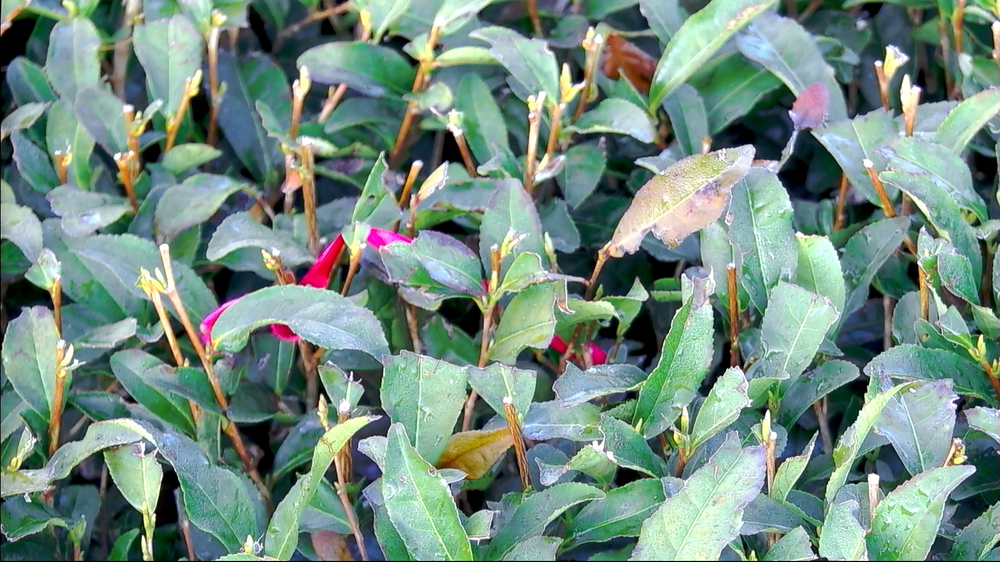

In [5]:
img = cv2.imread('resource/10.jpg')
display_cv_image(img)

In [6]:
def draw_hsv_histgram(img):
    hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = hsv_img[:,:,0], hsv_img[:,:,1], hsv_img[:,:,2]
    
    hist_h, bins = np.histogram(h.ravel(),256,[0,256])
    hist_s, bins = np.histogram(s.ravel(),256,[0,256])
    hist_v, bins = np.histogram(v.ravel(),256,[0,256])

    plt.xlim(0, 255)
#    plt.title('img.png')
    plt.plot(hist_h, "-h", label="Hue")
    plt.plot(hist_s, "-s", label="Saturation")
    plt.plot(hist_v, "-v", label="Value")
    plt.xlabel('Pixel Value', fontsize=15)
    plt.ylabel('Number of Pixels', fontsize=15)
    plt.legend()
    plt.grid()
    plt.show()

    print('Hue(色相)の        中央値：{} 平均：{} 分散：{}'.format(np.median(h), np.mean(h), np.var(h)))
    print('Saturation(彩度)の 中央値：{} 平均：{} 分散：{}'.format(np.median(s), np.mean(s), np.var(s)))
    print('Value(明度)の      中央値：{} 平均：{} 分散：{}'.format(np.median(v), np.mean(v), np.var(v)))

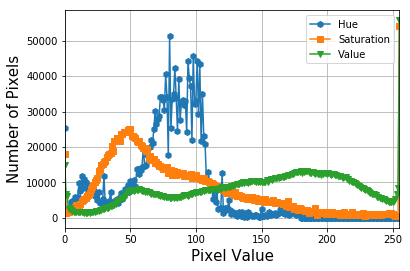

Hue(色相)の        中央値：82.0 平均：77.56600790895062 分散：952.395125016141
Saturation(彩度)の 中央値：70.0 平均：85.42595293209877 分散：3140.9647041459316
Value(明度)の      中央値：158.0 平均：149.11690152391975 分散：4174.683342617809


In [7]:
draw_hsv_histgram(img)

In [10]:
def detect_leaves(img):
    
    # 画像をhsv色空間に変換
    hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = hsv_img[:,:,0], hsv_img[:,:,1], hsv_img[:,:,2]
    
    # hueの値で絞り込み
    ret_h, img_h = cv2.threshold(hsv_img[:,:,0],30,255,cv2.THRESH_TOZERO)
    ret_h, img_h = cv2.threshold(img_h,110,255,cv2.THRESH_TOZERO_INV)
    ret_h, img_h = cv2.threshold(img_h,1,255,cv2.THRESH_BINARY)
    
    # saturationの値で絞り込み
    ret_s, img_s = cv2.threshold(hsv_img[:,:,1],20,255,cv2.THRESH_BINARY)
    
    # valueの値で絞り込み
    ret_v, img_v = cv2.threshold(hsv_img[:,:,2],0,255,cv2.THRESH_BINARY)
    
    selected_pixels = cv2.bitwise_and(img_h, img_s, mask=img_v)
    selected_leaves = cv2.bitwise_and(img, img, mask=selected_pixels)
    
    kernel = np.ones((5,5),np.uint8)
    gradient = cv2.morphologyEx(selected_pixels, cv2.MORPH_GRADIENT, kernel)
    closing = cv2.morphologyEx(selected_pixels, cv2.MORPH_CLOSE, kernel)
    opening = cv2.morphologyEx(selected_pixels, cv2.MORPH_OPEN, kernel)
    
    close_and_open = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel)
    open_and_close = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)
    
    display_cv_image(selected_pixels)
    display_cv_image(closing)
#    display_cv_image(opening)
#    display_cv_image(close_and_open)
#    display_cv_image(open_and_close)
    
    display_cv_image(selected_leaves)
    
    cv2.imwrite('savefig/output1.jpg', selected_leaves)
    cv2.imwrite('savefig/out_mask1.jpg', selected_pixels)
    
    return selected_pixels

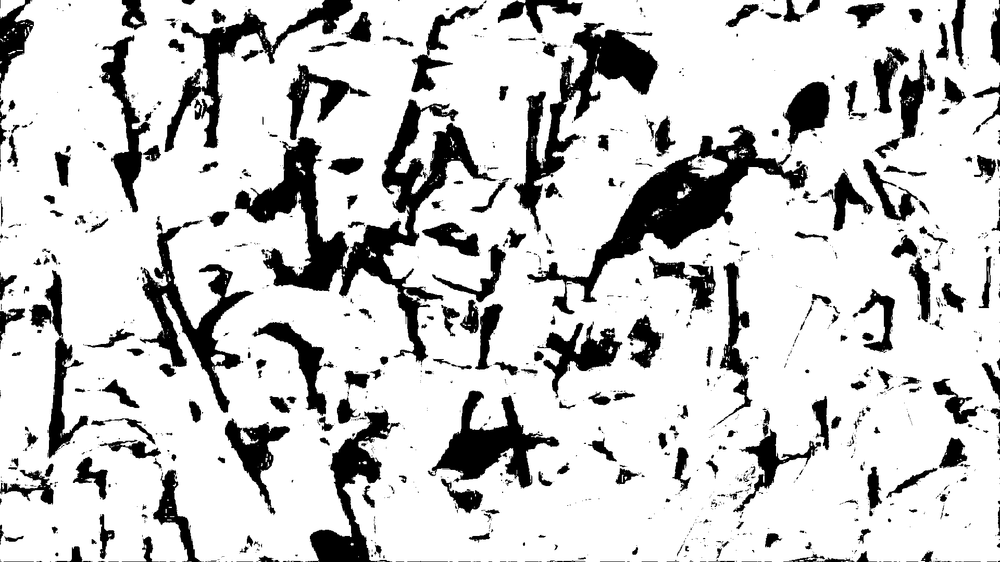

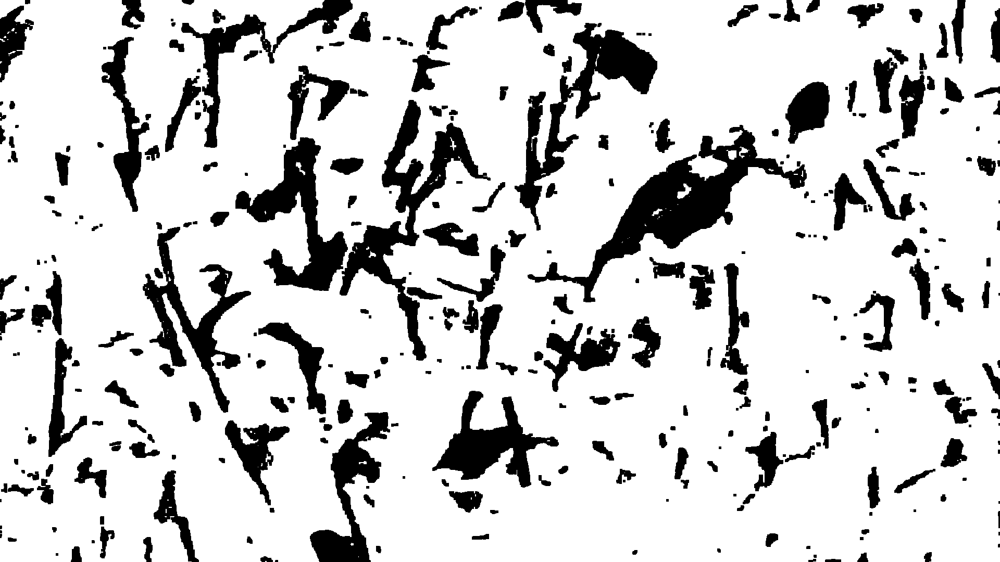

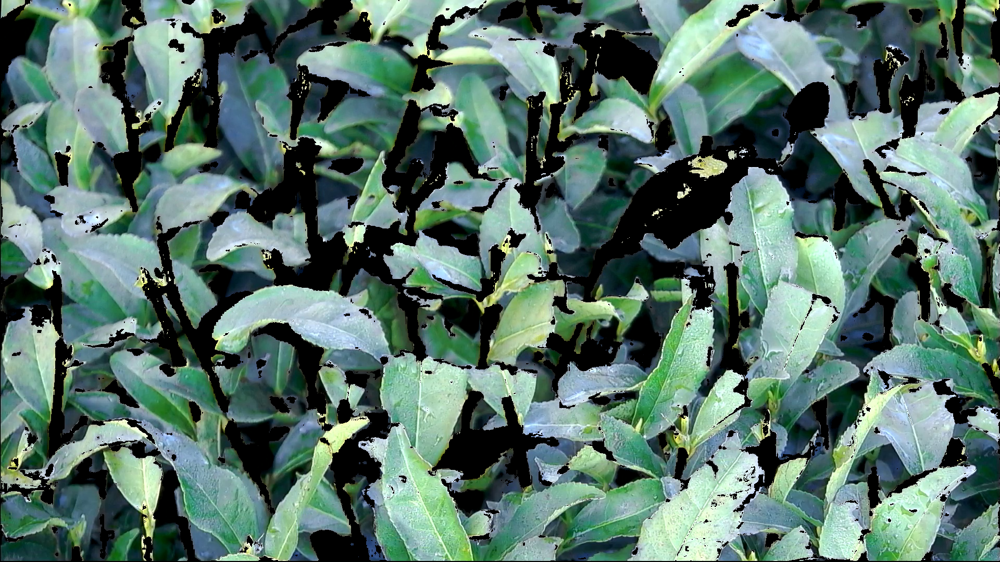

In [11]:
pixels_on_leaves = detect_leaves(img)

In [14]:
hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
ret_h, img_h = cv2.threshold(hsv_img[:,:,0],30,255,cv2.THRESH_TOZERO)
ret_h, img_h = cv2.threshold(img_h,110,255,cv2.THRESH_TOZERO_INV)

In [15]:
def draw_contours(ax, img, contours):
    ax.imshow(img)
    ax.axis('off')
    for i, cnt in enumerate(contours):
        cnt = np.squeeze(cnt, axis=1)

        ax.add_patch(Polygon(cnt, color='b', fill=None, lw=2))

        ax.plot(cnt[:, 0], cnt[:, 1], 'ro', mew=0, ms=4)

        ax.text(cnt[0][0], cnt[0][1], i, color='orange', size='20')

In [16]:
img_h = cv2.equalizeHist(img_h)

In [17]:
contours, hierarchy = cv2.findContours(img_h, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

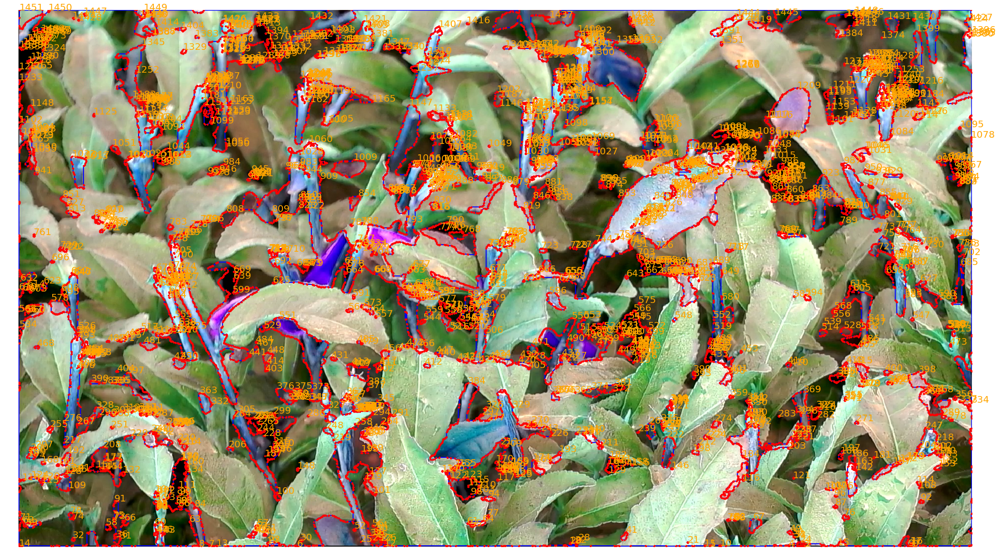

In [18]:
fig, ax = plt.subplots(figsize=(36, 36))
draw_contours(ax, img, contours)
plt.show()

In [28]:
canny = cv2.Canny(img_h, 100, 220)

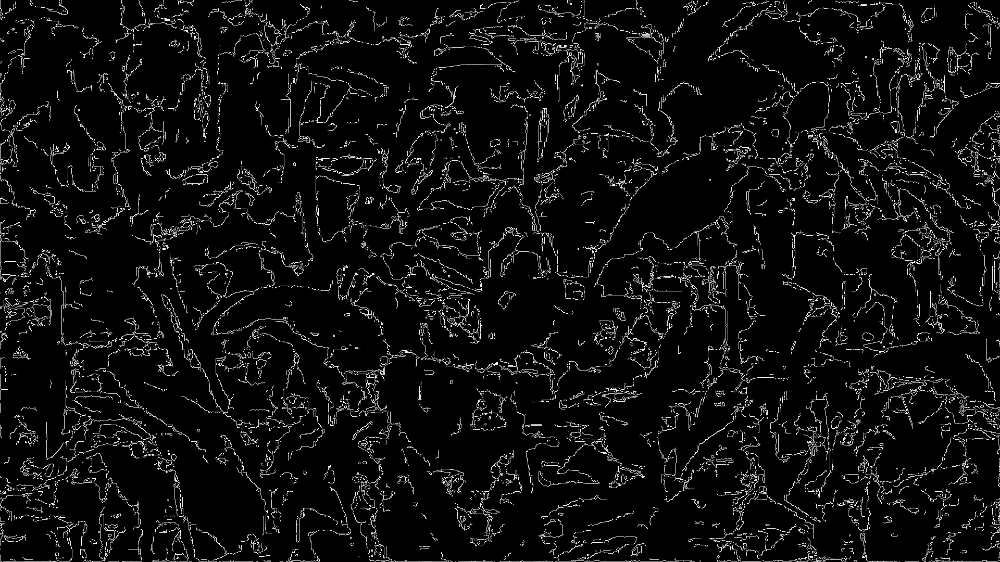

In [29]:
display_cv_image(canny)

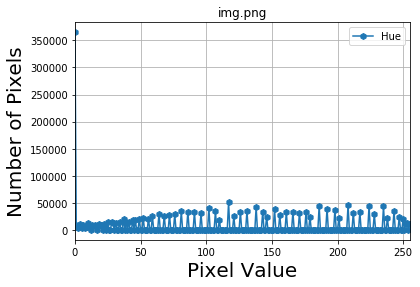

In [21]:
hist_h, bins = np.histogram(img_h.ravel(),256,[0,256])

plt.xlim(0, 255)
plt.title('img.png')
plt.plot(hist_h, "-h", label="Hue")

plt.xlabel('Pixel Value', fontsize=20)
plt.ylabel('Number of Pixels', fontsize=20)
plt.legend()
plt.grid()
plt.show()